# Processamento de Imagens

Nessa aula vamos sair um pouco do sensoriamento remoto "puro" (bandas, índices espectrais) e voltar pro básico de **processamento de imagens**. No fundo, bem no fundo, toda imagem de satélite também é apenas... uma imagem. As mesmas ferramentas que processam uma foto do seu celular podem processar uma cena de satélite. 

Para a aula de hoje, vamos usar duas bibliotecas extremamente comuns no processamento de imagem.

- **OpenCV** (`cv2`): a biblioteca mais usada em visão computacional, super rápida (em C++), mas com algumas pegadinhas bem conhecidas (spoiler: BGR).
- **scikit-image** (`skimage`): mais "pythônica", integra bem com numpy/matplotlib, e tem uma ótima documentação.

Roteiro de hoje:
1. Imagem = array numpy (de novo porque sim)
2. OpenCV vs scikit-image
3. Cropping
4. Escala de cinza (grayscale)
5. Histograma e equalização
6. Correção de brilho/contraste
7. Resizing e rescaling
8. Kernels e blurring (incluindo Gaussian blur)
9. Detecção de bordas (Sobel, Canny)
10. Connected Component Analysis
11. Ligando tudo com o pré-processamento usado pra treinar redes neurais

Vamos usar uma imagem de satélite real (um quicklook CBERS-4/MUX) como nossa "cobaia" — mas hoje ela vai ser tratada como uma imagem qualquer (PNG comum), sem `rasterio`, sem bandas espectrais. É só pixels.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, exposure, filters, feature, measure, transform

print("OpenCV:", cv2.__version__)
import skimage
print("scikit-image:", skimage.__version__)

OpenCV: 5.0.0
scikit-image: 0.26.0


## Nossa imagem de hoje

É um quicklook (PNG já pronto, tipo uma "foto" da cena) de uma cena CBERS-4/MUX sobre a região de Novo Progresso (PA). A mesma área do desmatamento que vimos na aula de STAC. Só que hoje, em vez de baixar bandas separadas com `rasterio`, vamos direto no PNG, como qualquer imagem.

In [2]:
import os
import requests

img_dir = "images"
os.makedirs(img_dir, exist_ok=True)
img_path = os.path.join(img_dir, "cbers4_novo_progresso_2023.png")

if not os.path.exists(img_path):
    url = ("https://data.inpe.br/bdc/data/cbers4/2023_07/CBERS_4_MUX_DRD_2023_07_18.13_49_30_CB11/"
           "167_109_0/4_BC_UTM_WGS84/CBERS_4_MUX_20230718_167_109.png")
    resp = requests.get(url, timeout=30)
    with open(img_path, "wb") as f:
        f.write(resp.content)

print("arquivo:", img_path, "-", os.path.getsize(img_path) / 1024, "KB")

arquivo: images/cbers4_novo_progresso_2023.png - 379.935546875 KB


# Imagem é nada menos que um array em numpy

Vale a pena fixar essa ideia na cabeça de porongo. (baseado em: [scikit-image — Images are numpy arrays](https://scikit-image.org/docs/stable/user_guide/numpy_images.html)):

- Uma imagem colorida é um array 3D: `(altura, largura, canais)` — normalmente 3 canais (R, G, B);
- Cada pixel é um número de `0` a `255` (Quando a image é do tipo `uint8`, ou seja 8 bits);
- `imagem[linha, coluna]` te dá um pixel (um array de 3 números); `imagem[linha, coluna, canal]` te dá um número só;
- Como é numpy, tudo que você já sabe sobre slicing ou indexação funcionará, como cortar pedaços, pegar só um canal, inverter, etc.

In [3]:
img_rgb = skimage.io.imread(img_path)[:, :, :3]  # descarta o canal alpha, se tiver


In [5]:
img_rgb.shape

(582, 611, 3)

In [ ]:
# Pegando um pixel - aqui vai mostrar os 3 canais (RGB)
img_rgb[100,200]

array([ 75, 163, 124], dtype=uint8)

In [7]:
img_rgb[100,200,1]

np.uint8(163)

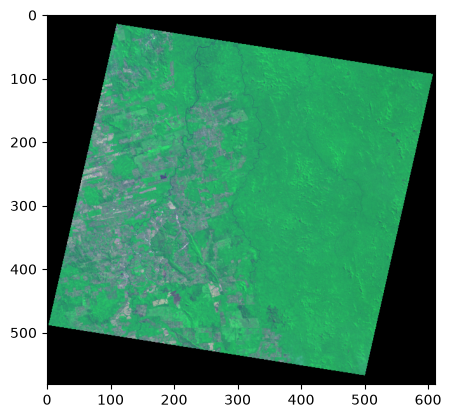

In [8]:
plt.imshow(img_rgb)

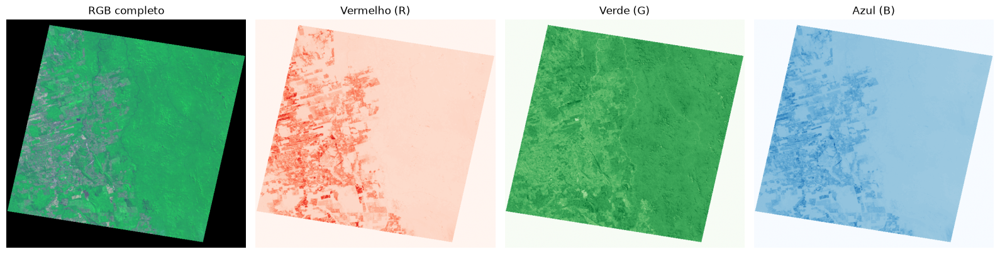

In [9]:

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(img_rgb)
axes[0].set_title("RGB completo")
for ax, ch, nome, cmap in zip(axes[1:], range(3), ["Vermelho (R)", "Verde (G)", "Azul (B)"],
                                ["Reds", "Greens", "Blues"]):
    ax.imshow(img_rgb[:, :, ch], cmap=cmap)
    ax.set_title(nome)
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

# 2. A pegadinha do BGR

Por razões históricas (câmeras antigas, bibliotecas de 20+ anos atrás), o OpenCV lê e escreve imagens coloridas em ordem **BGR** (azul, verde, vermelho), o que é ao contrário de praticamente todo o resto do mundo Python (`skimage`, `matplotlib`, `PIL`), que usa **RGB**.

Isso é uma fonte clássica de bugs, fica ligado!  Se você ler com `cv2.imread` e mostrar direto com `matplotlib`, as cores saem trocadas (fica com um tom azulado estranho).

são iguais ao lido pelo skimage? True


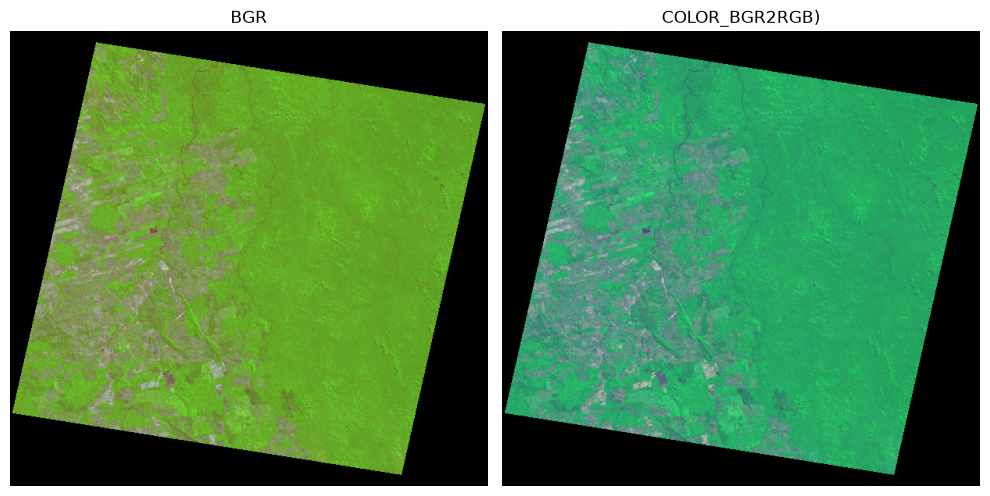

In [16]:
img_bgr = cv2.imread(img_path)  # o OpenCV já lê em BGR

# veja como a biblioteca cv2 possue uma linguagem um pouco diferente das demais bibliotecas em python
img_bgr_para_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

print("são iguais ao lido pelo skimage?", np.array_equal(img_bgr_para_rgb, img_rgb))

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img_bgr)  # errado de propósito!
axes[0].set_title("BGR")
axes[1].imshow(img_bgr_para_rgb)
axes[1].set_title("COLOR_BGR2RGB)")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

# 3. Cropping

Cropping é basicamente uma operação de cortamos o pedaço que nos interessa da imagem. Ele pode ser feito de forma muito fácil e acessível através de uma simples indexação dos array. 

Tal como: `imagem[linha_inicio:linha_fim, coluna_inicio:coluna_fim]`.

In [17]:
img = img_rgb[220:480, 120:520]  # daqui pra frente, "img" é a nossa imagem de trabalho


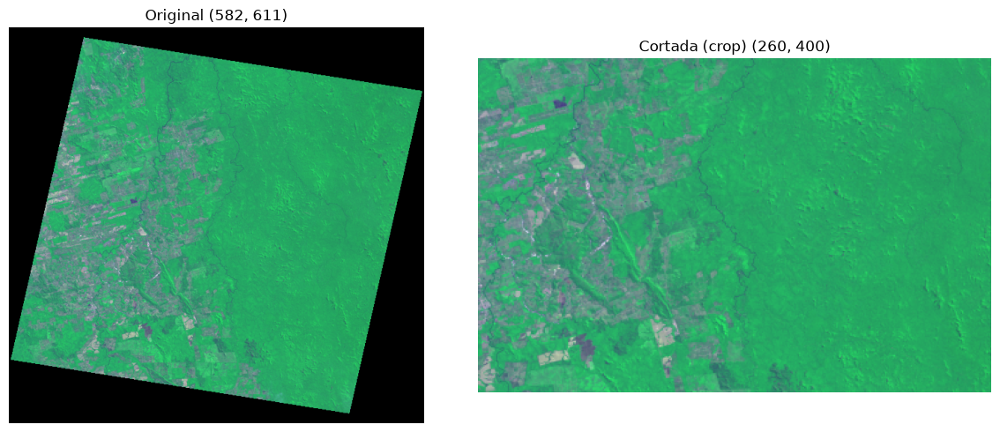

In [18]:
img = img_rgb[220:480, 120:520]  # daqui pra frente, "img" é a nossa imagem de trabalho

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_rgb)
axes[0].set_title(f"Original {img_rgb.shape[:2]}")
axes[1].imshow(img)
axes[1].set_title(f"Cortada (crop) {img.shape[:2]}")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

# Escala de cinza (grayscale)

Se temos uma imagem em RGB e três canais, poderíamos converter ela para uma escala de cinza. Contudo, isso não é apenas calcular a média dos três canais pois isso não replica o comportamento do olho humano. Assim, precisamos fazer uma média ponderada, esses valores de peso já são bem estabelecidos na literatura e as duas bibliotecas possuem funções para converter de forma muito simples. 

O olho humano é mais sensível ao verde do que ao azul, por exemplo. Por isso se usa uma média **ponderada**:

$$\text{cinza} = 0.299 \times R + 0.587 \times G + 0.114 \times B$$

Tanto o OpenCV quanto o scikit-image já implementam isso pra você.

In [19]:
# primeiro le a imagem e converte pra cinza
gray_cv = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)     # uint8, 0-255

# ja le convertendo para cinza e escala normaliza entre 0-1 
gray_sk = color.rgb2gray(img)                        # float, 0.0-1.0


In [22]:
print("cv2:     dtype =", gray_cv.dtype, "| min/max =", gray_cv.min(), gray_cv.max())
print("skimage: dtype =", gray_sk.dtype, "| min/max =", round(gray_sk.min(), 3), round(gray_sk.max(), 3))


cv2:     dtype = uint8 | min/max = 71 213
skimage: dtype = float64 | min/max = 0.261 0.835


cv2:     dtype = uint8 | min/max = 71 213
skimage: dtype = float64 | min/max = 0.261 0.835


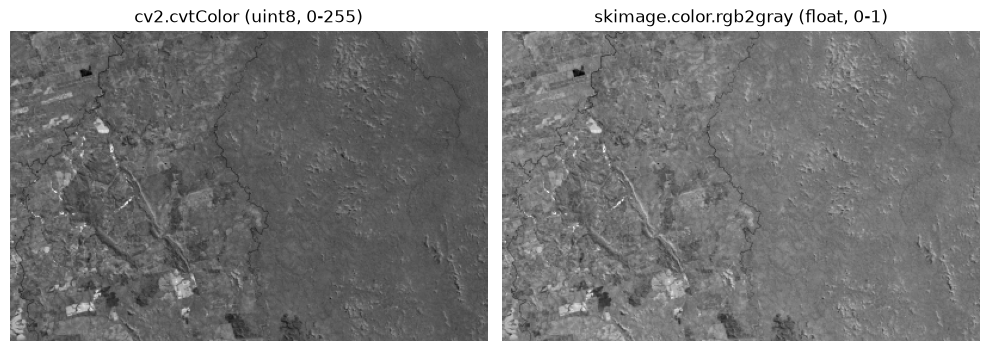

In [32]:
gray_cv = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)     # uint8, 0-255
gray_sk = color.rgb2gray(img)                        # float, 0.0-1.0

print("cv2:     dtype =", gray_cv.dtype, "| min/max =", gray_cv.min(), gray_cv.max())
print("skimage: dtype =", gray_sk.dtype, "| min/max =", round(gray_sk.min(), 3), round(gray_sk.max(), 3))

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(gray_cv, cmap="gray")
axes[0].set_title("cv2.cvtColor (uint8, 0-255)")
axes[1].imshow(gray_sk, cmap="gray")
axes[1].set_title("skimage.color.rgb2gray (float, 0-1)")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

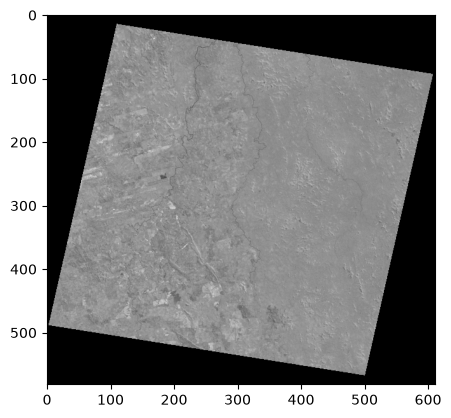

In [31]:
# tentamos fazer o mesmo com scikit-image
gray_skimage = skimage.color.rgb2gray(img_rgb)
plt.imshow(gray_skimage, cmap='gray')

# Correção de brilho e constrate

### Convertendo para ponto flutuante em [0, 1]

Pra facilitar a aritmética das próximas seções (brilho e contraste), vamos converter a imagem para ponto flutuante, com valores entre `0` e `1`, usando `img_as_float`. Isso evita os problemas de estouro (overflow) de inteiros que vimos antes, e deixa as fórmulas bem mais diretas de entender.

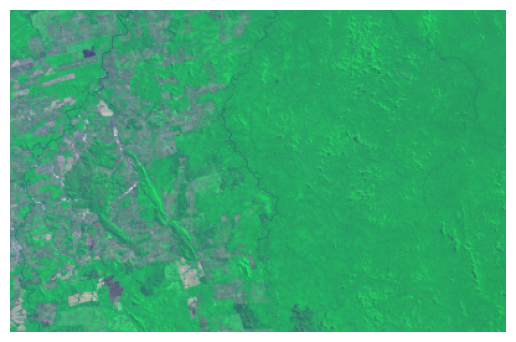

In [37]:
from skimage import img_as_float

# Convertendo para ponto flutuante, no intervalo [0, 1]
image = img_as_float(img)

plt.imshow(image)
plt.axis("off")
plt.show()

## Correção de brilho 

O brilho é relacionado com a intensidade dos valores. Se nossa image é um `uint8`, sua escala vai de 0-255, onde zero seria uma intensidade mais escura e 255 mais clara. Se a gente quer aumentar o brilho, a gente está aumentando esses valores para se aproximar de 255.

```
0       - black
50      - dark gray
128     - medium gray
200     - light gray
255     - white
```
Portanto o brilho responde a questão se essa imagem é geralmente mais clara ou mais escura. 

A forma mais simples de mudar o brilho é somar (ou subtrair) uma constante de cada pixel:

$$ I_{novo} = I + \beta $$

onde $\beta$ controla o brilho.

In [57]:
brilho = 0.2

mais_claro = np.clip(image + brilho, 0, 1)
mais_escuro = np.clip(image - brilho, 0, 1)

`np.clip()` é essencial aqui: as intensidades válidas de uma imagem precisam ficar entre `0` e `1` — sem ele, valores como `1.1` ou `-0.05` quebrariam a visualização

Podemos visualizar os resultados:

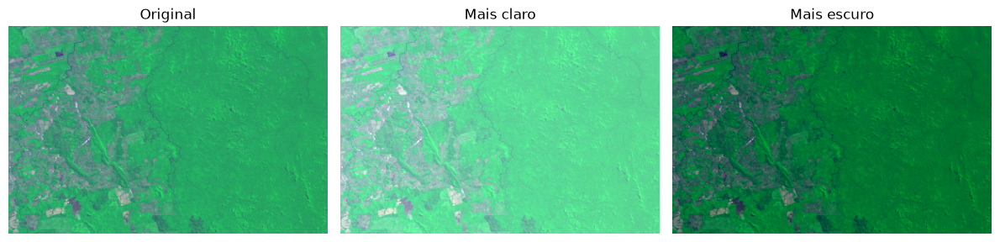

In [58]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].imshow(image)
axes[0].set_title("Original")

axes[1].imshow(mais_claro)
axes[1].set_title("Mais claro")

axes[2].imshow(mais_escuro)
axes[2].set_title("Mais escuro")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()

**Ponto de atenção:** para uma imagem em escala de cinza de 8 bits (`uint8`), a operação equivalente seria:

```python
mais_claro = np.clip(image + 30, 0, 255)
```

A ideia central não muda pois o brilho é uma mudança no **nível geral** de intensidade.

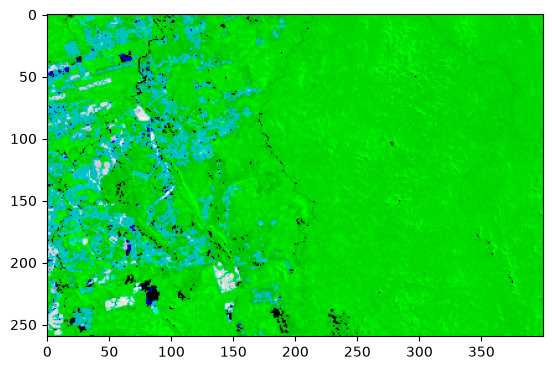

In [61]:
# Uma vez que aumentamos o brilho de uma imagem, podemos mascarar apenas os pixels de alta intensidade
mais_claro[mais_claro<0.7]=0
plt.imshow(mais_claro)

## Correção de contraste 

O constrate é uma alteração de valores para longe de um determinado valor central. Portanto, constrate responde a questão de quão diferente esses valores estão das regiões mais claras e escuras. 
 
O contraste pode ser alterado multiplicando os valores de pixel em torno de um valor central:

$$ I_{novo} = \alpha(I - c) + c $$

onde:

- $\alpha > 1$ → aumenta o contraste
- $0 < \alpha < 1$ → diminui o contraste
- $c$ → intensidade de referência, geralmente `0.5`

In [40]:
contraste = 1.5

alto_contraste = np.clip(
    contraste * (image - 0.5) + 0.5,
    0,
    1
)

In [44]:
# Para reduzir o contraste

contraste = 0.3
baixo_contraste = np.clip(
    contraste * (image - 0.5) + 0.5,
    0,
    1
)

**Por que subtrair e somar 0,5?**

Suponha um pixel com valor `0.7`:

```
0.7 - 0.5 = 0.2
0.2 × 1.5 = 0.3
0.3 + 0.5 = 0.8
```

O pixel se afasta do ponto médio, aumentando o contraste.

Da mesma forma, um pixel de `0.3` vira `0.2`, se afastando do ponto médio na direção oposta.

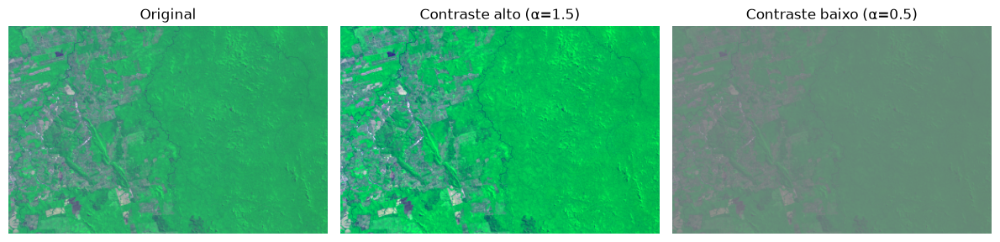

In [45]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].imshow(image)
axes[0].set_title("Original")

axes[1].imshow(alto_contraste)
axes[1].set_title("Contraste alto (α=1.5)")

axes[2].imshow(baixo_contraste)
axes[2].set_title("Contraste baixo (α=0.5)")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()

## Alongamento de contraste 

Uma técnica particularmente didática é o **contrast stretching**. O scikit-image já oferece isso pronto em `exposure.rescale_intensity()`:

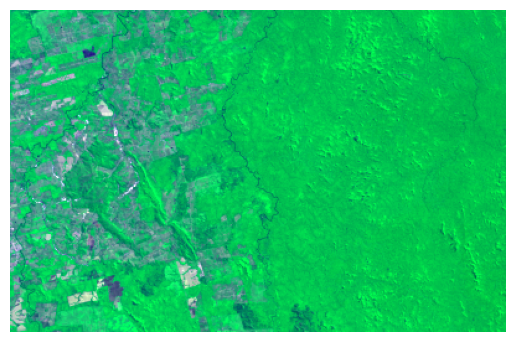

In [62]:
from skimage import exposure

esticada = exposure.rescale_intensity(
    image,
    in_range=(0.2, 0.8),
    out_range=(0, 1)
)

plt.imshow(esticada)
plt.axis("off")
plt.show()

Aqui, pixels próximos de `0.2` viram preto e pixels próximos de `0.8` viram branco.


Isso é útil quando a imagem ocupa só uma pequena parte da faixa de intensidade disponível.

### Contrast stretching automático

Em vez de escolher `0.2` e `0.8` na mão, dá pra calcular limites úteis a partir da própria imagem, por exemplo, usando percentis:

In [65]:
np.percentile(image, 2)

np.float64(0.1411764705882353)

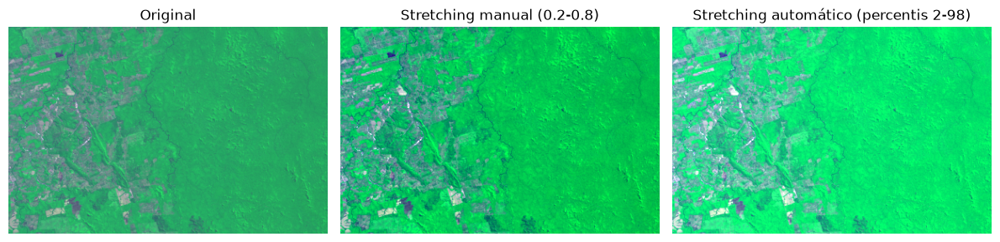

In [66]:
baixo = np.percentile(image, 2)
alto = np.percentile(image, 98)

esticada_automatica = exposure.rescale_intensity(
    image,
    in_range=(baixo, alto),
    out_range=(0, 1)
)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(image)
axes[0].set_title("Original")
axes[1].imshow(esticada)
axes[1].set_title("Stretching manual (0.2-0.8)")
axes[2].imshow(esticada_automatica)
axes[2].set_title("Stretching automático (percentis 2-98)")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

O 2º percentil vira aproximadamente preto e o 98º percentil vira aproximadamente branco.

Isso costuma funcionar melhor do que usar o mínimo e o máximo absolutos, porque alguns poucos pixels extremos não acabam dominando toda a transformação.

# Histograma e equalização

Um **histograma** de imagem é só a contagem de quantos pixels têm cada valor de intensidade (0 a 255). Imagens com baixo contrast e meio embaçadas, (muito comum em imagens de satélite com neblina/bruma atmosférica) têm um histograma concentrado numa faixa estreita.

Dessa forma, já vimos uma das maneiras de corrigir isso que é alterando o constrate e brilho de uma image. 

Uma outra forma bastante comum de corrigir é através da equalização do histograma. 

**Equalização de histograma** redistribui essas intensidades pra ocupar toda a faixa de 0-255, "esticando" o contraste. Vamos comparar três versões:
- `cv2.equalizeHist` — equalização global clássica;
- `skimage.exposure.equalize_hist` — equivalente do scikit-image;
- `equalize_adapthist` (CLAHE) — equalização **adaptativa**, calculada em blocos da imagem. Geralmente funciona melhor quando o contraste varia de uma região pra outra (ex: nuvens de um lado, sombra do outro).

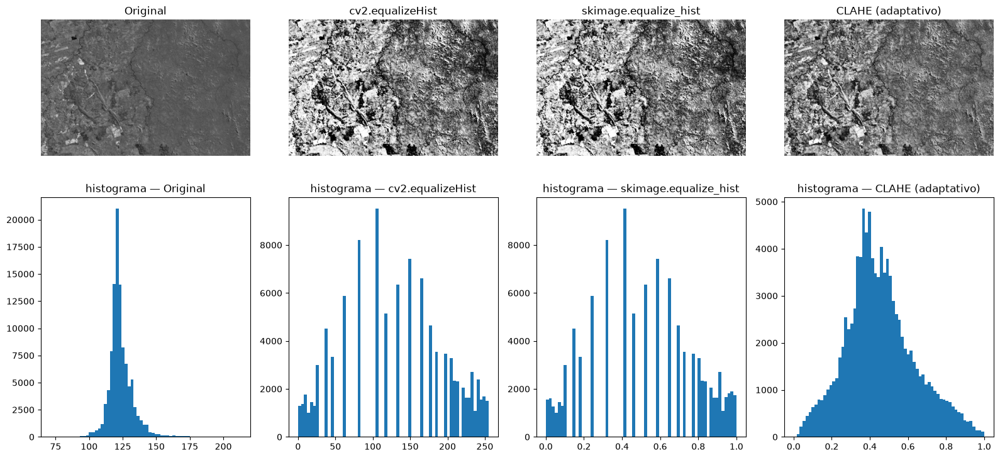

In [7]:
eq_cv = cv2.equalizeHist(gray_cv)
eq_sk = exposure.equalize_hist(gray_cv)
eq_clahe = exposure.equalize_adapthist(gray_cv, clip_limit=0.03)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for ax, imagem, titulo in zip(axes[0], [gray_cv, eq_cv, eq_sk, eq_clahe],
                                ["Original", "cv2.equalizeHist", "skimage.equalize_hist", "CLAHE (adaptativo)"]):
    ax.imshow(imagem, cmap="gray")
    ax.set_title(titulo)
    ax.axis("off")

for ax, imagem, titulo in zip(axes[1], [gray_cv, eq_cv, eq_sk, eq_clahe],
                                ["Original", "cv2.equalizeHist", "skimage.equalize_hist", "CLAHE (adaptativo)"]):
    ax.hist(np.asarray(imagem).ravel(), bins=64)
    ax.set_title(f"histograma — {titulo}")

plt.tight_layout()
plt.show()

## Qual a ideia matemática da normalização do histograma

A equalização que acabamos de ver (`cv2.equalizeHist`, `equalize_hist`, CLAHE) não é mágica. Vamos reconstruir esse pipeline do zero, passo a passo, usando nossa imagem em escala de cinza e `uint8` com 0-255:

```
Imagem
  ↓
Histograma
  ↓
Histograma normalizado (PMF)
  ↓
CDF
  ↓
Função de mapeamento
  ↓
Novas intensidades
  ↓
Imagem equalizada
```


O histograma conta quantos pixels têm cada intensidade $r_k$, para $k = 0, 1, \dots, L-1$ (com $L = 256$ níveis):

$$ h(r_k) = \#\{(i,j) \;:\; I(i,j) = r_k\} $$

Somando todos os bins do histograma, recuperamos o número total de pixels da imagem ($M \times N$):

$$ \sum_{k=0}^{L-1} h(r_k) = M \times N $$


total de pixels (M x N): 104000
soma do histograma:      104000


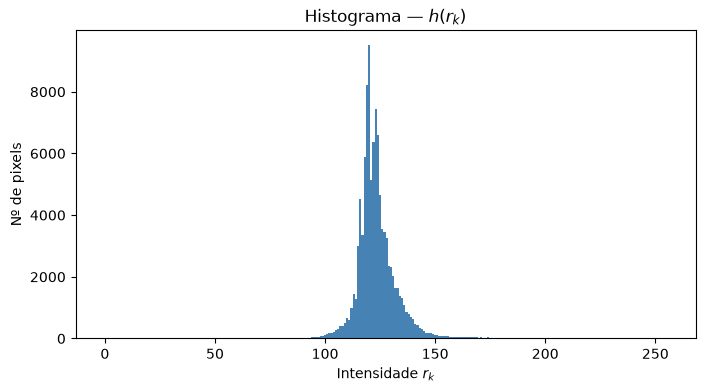

In [68]:


M, N = gray_cv.shape
L = 256

histograma, bins = np.histogram(gray_cv.ravel(), bins=L, range=(0, L))

print("total de pixels (M x N):", M * N)
print("soma do histograma:     ", histograma.sum())

plt.figure(figsize=(8, 4))
plt.bar(np.arange(L), histograma, width=1, color="steelblue")
plt.title("Histograma — $h(r_k)$")
plt.xlabel("Intensidade $r_k$")
plt.ylabel("Nº de pixels")
plt.show()

Dividindo cada $h(r_k)$ pelo total de pixels, transformamos contagens em uma **distribuição de probabilidade**. Essa distribuição de probabilidade é a chance de um pixel qualquer da imagem ter a intensidade $r_k$:

$$ p(r_k) = \frac{h(r_k)}{M \times N} $$

Como $h(r_k) \geq 0$ e a soma de todos os $h(r_k)$ é $M \times N$ (Passo 1), temos as duas propriedades de uma PMF válida:

$$ p(r_k) \geq 0 \quad \text{e} \quad \sum_{k=0}^{L-1} p(r_k) = 1 $$

soma da PMF: 1.0


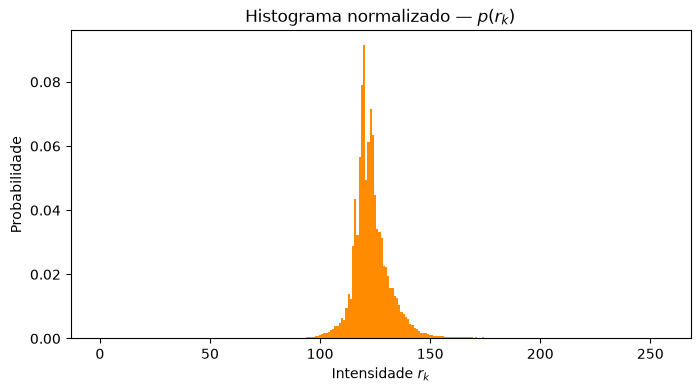

In [70]:

pmf = histograma / (M * N)
print("soma da PMF:", pmf.sum())  # deve dar (bem próximo de) 1.0

plt.figure(figsize=(8, 4))
plt.bar(np.arange(L), pmf, width=1, color="darkorange")
plt.title("Histograma normalizado — $p(r_k)$")
plt.xlabel("Intensidade $r_k$")
plt.ylabel("Probabilidade")
plt.show()

A CDF acumula a probabilidade de um pixel ter intensidade **até** $r_k$:

$$ c(r_k) = \sum_{j=0}^{k} p(r_j) $$

Duas propriedades saem direto dessa soma:

- **Monotonicamente não decrescente**: $c(r_k) \geq c(r_{k-1})$, já que só somamos termos $\geq 0$.
- **Termina em 1**: $c(r_{L-1}) = \sum_{j=0}^{L-1} p(r_j) = 1$ (é a soma completa da PMF do Passo 2).

c(r_0)   = 0.0
c(r_255) = 1.0


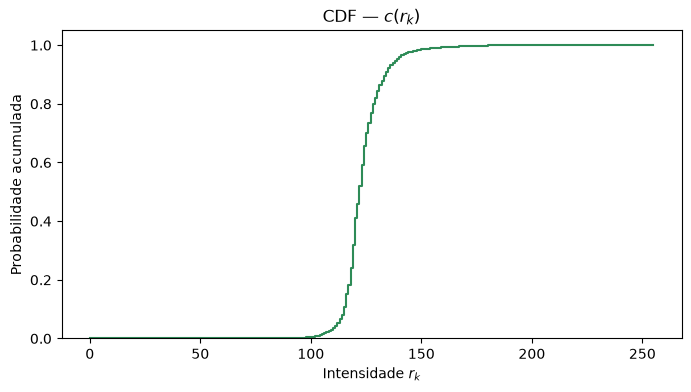

In [71]:


cdf = np.cumsum(pmf)
print("c(r_0)   =", round(cdf[0], 4))
print("c(r_255) =", round(cdf[-1], 4))

plt.figure(figsize=(8, 4))
plt.plot(np.arange(L), cdf, color="seagreen", drawstyle="steps-post")
plt.title("CDF — $c(r_k)$")
plt.xlabel("Intensidade $r_k$")
plt.ylabel("Probabilidade acumulada")
plt.ylim(0, 1.05)
plt.show()

A ideia da equalização é usar a própria CDF como função de transformação, reescalada para a faixa de intensidades

 $[0, L-1]$ (0-255):

$$ T(r_k) = \text{round}\big((L-1)\, c(r_k)\big) $$

Essa multiplicação da CDF pelo numero de bins, transforma a CDF em uma distribuição uniforme. Basicamente nessa etapa estamos aplicando uma função que mapeia a CDF numa distribuição uniforme. 


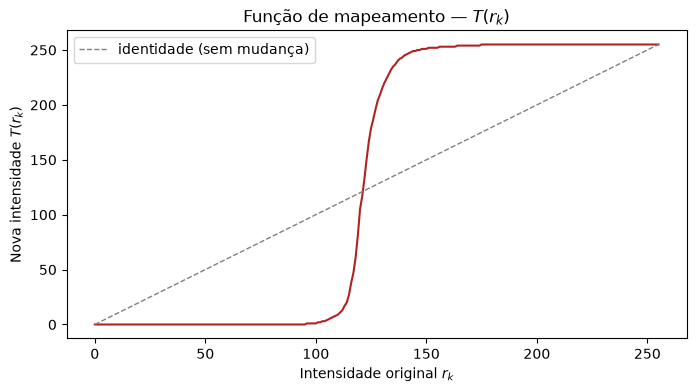

In [73]:
T = np.round((L - 1) * cdf).astype(np.uint8)

plt.figure(figsize=(8, 4))
plt.plot(np.arange(L), T, color="firebrick")
plt.plot([0, L - 1], [0, L - 1], "--", color="gray", linewidth=1, label="identidade (sem mudança)")
plt.title("Função de mapeamento — $T(r_k)$")
plt.xlabel("Intensidade original $r_k$")
plt.ylabel("Nova intensidade $T(r_k)$")
plt.legend()
plt.show()

Por fim, aplicamos $T$ pixel a pixel — trocando cada intensidade $r_k$ pela sua nova intensidade $T(r_k)$ (uma simples tabela de consulta, ou *lookup table*):

$$ I_{eq}(i, j) = T\big(I(i, j)\big) $$

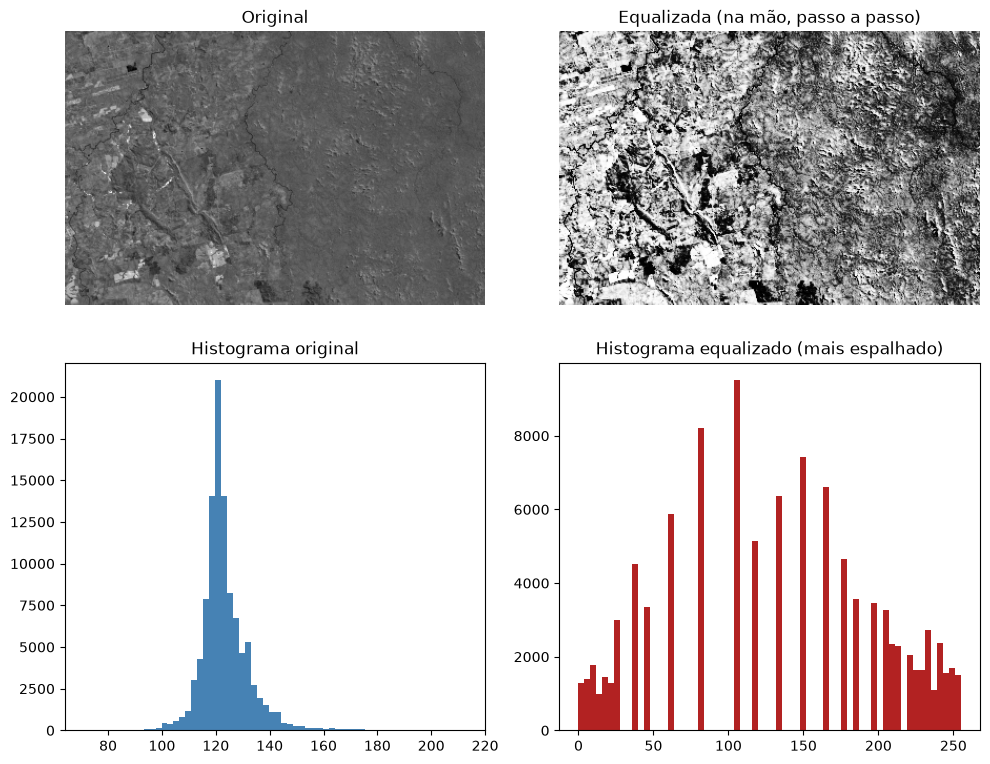

In [79]:
gray_equalizado_na_mao = T[gray_cv]  # Look Up table - LUT: troca cada pixel pelo seu valor mapeado

fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes[0, 0].imshow(gray_cv, cmap="gray")
axes[0, 0].set_title("Original")
axes[0, 1].imshow(gray_equalizado_na_mao, cmap="gray")
axes[0, 1].set_title("Equalizada (na mão, passo a passo)")
axes[1, 0].hist(gray_cv.ravel(), bins=64, color="steelblue")
axes[1, 0].set_title("Histograma original")
axes[1, 1].hist(gray_equalizado_na_mao.ravel(), bins=64, color="firebrick")
axes[1, 1].set_title("Histograma equalizado (mais espalhado)")
for ax in axes[0]:
    ax.axis("off")
plt.tight_layout()
plt.show()


Pequeno exemplo numérico:

Dada a matrix M(4x4) com 16 pixels:

0  0  1  1
1  2  2  2
3  3  4  5
5  5  6  7

O histograma dessa matriz é: 

| Intensity \(r\) | Count \(n_r\) |
| --------------: | ------------: |
|               0 |             2 |
|               1 |             3 |
|               2 |             3 |
|               3 |             2 |
|               4 |             1 |
|               5 |             3 |
|               6 |             1 |
|               7 |             1 |


Normalizando essa matrix

$ p(r)=n_r/16 $

Logo a tabela vira:
| \(r\) | \(p(r)\) |    CDF |
| ----: | -------: | -----: |
|     0 |    0.125 |  0.125 |
|     1 |   0.1875 | 0.3125 |
|     2 |   0.1875 | 0.5000 |
|     3 |    0.125 | 0.6250 |
|     4 |   0.0625 | 0.6875 |
|     5 |   0.1875 | 0.8750 |
|     6 |   0.0625 | 0.9375 |
|     7 |   0.0625 | 1.0000 |

Sabendo que o numero de bins de nosso histograma é 7, podemos calcular a transformada T

$ T = 7×CDF(r)$

e assim, nossa nova matriz equalizada fica:

| Original \(r\) |   CDF | New \(s\) |
| -------------: | ----: | --------: |
|              0 |  .125 |      .875 |
|              1 | .3125 |    2.1875 |
|              2 |    .5 |       3.5 |
|              3 |  .625 |     4.375 |
|              4 | .6875 |    4.8125 |
|              5 |  .875 |     6.125 |
|              6 | .9375 |    6.5625 |
|              7 |   1.0 |         7 |

Aqui, precisaríamos só arredondar esses numeros que foram mapeados.

# Resizing e rescaling

Os dois fazem a mesma coisa no geral pois reamostram uma image para outra grade de pixels, mas possuem alguma pequena diferença:

- **resize**: você diz o **tamanho final exato** (ex: `224x224`) — é o que quase toda rede neural espera como entrada;
- **rescale**: você diz um **fator de escala** (ex: `0.5` = metade do tamanho) e a função mantém a proporção original.

O resize necessita sempre um método de interpolação. Image que estamos saindo de um determinado numero de pixels para outro, portanto temos que interpolar esses pixels para pertencerem a uma nova grade.
Também importa o **método de interpolação**: `INTER_NEAREST` ("quadriculado"), `INTER_LINEAR`/`INTER_CUBIC` (mais suave), `INTER_AREA` (melhor pra *diminuir* a imagem).

original: (260, 400, 3)
resize p/ 224x224: (224, 224, 3)
rescale por 0.5: (130, 200, 3)


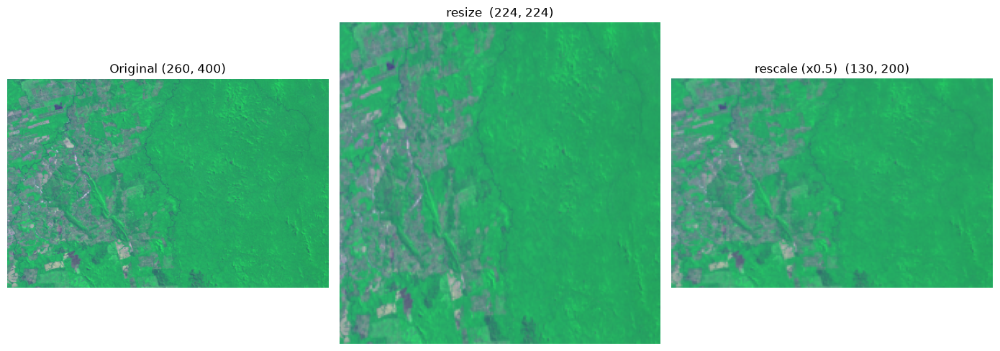

In [82]:
resized = cv2.resize(img, 
                     (224, 224), 
                     interpolation=cv2.INTER_AREA)  # tamanho fixo
rescaled = transform.rescale(img, 
                             0.5, 
                             channel_axis=-1, 
                             anti_aliasing=True)  # metade do tamanho, mesma proporção

print("original:", img.shape)
print("resize p/ 224x224:", resized.shape)
print("rescale por 0.5:", rescaled.shape)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(img)
axes[0].set_title(f"Original {img.shape[:2]}")
axes[1].imshow(resized)
axes[1].set_title(f"resize  {resized.shape[:2]}")
axes[2].imshow(rescaled)
axes[2].set_title(f"rescale (x0.5)  {rescaled.shape[:2]}")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

original: (260, 400, 3)
resize p/ 224x224: (224, 224, 3)
rescale por 0.5: (130, 200, 3)


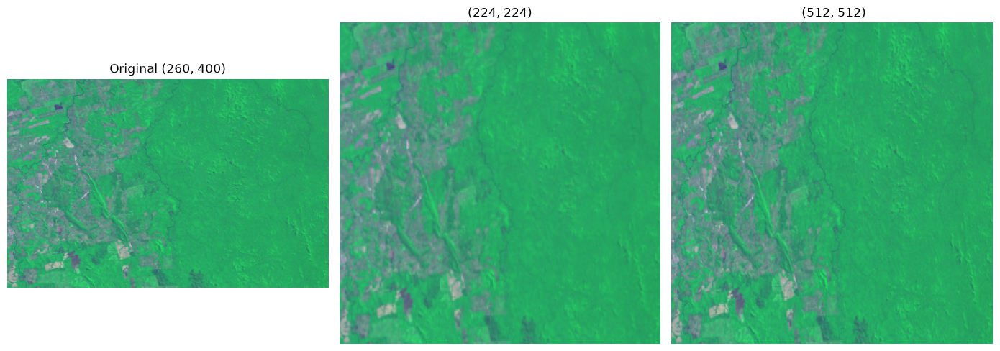

In [84]:
resized = cv2.resize(img, 
                     (224, 224), 
                     interpolation=cv2.INTER_AREA)  # tamanho fixo
resized2 = cv2.resize(img, 
                     (512, 512), 
                     interpolation=cv2.INTER_AREA)  # metade do tamanho, mesma proporção

print("original:", img.shape)
print("resize p/ 224x224:", resized.shape)
print("rescale por 0.5:", rescaled.shape)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(img)
axes[0].set_title(f"Original {img.shape[:2]}")
axes[1].imshow(resized)
axes[1].set_title(f"{resized.shape[:2]}")
axes[2].imshow(resized2)
axes[2].set_title(f" {resized2.shape[:2]}")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

# 8. Kernels 

Explicação visual de Kernels: [SETOSA](https://setosa.io/ev/image-kernels/)

## O que é um kernel?

Um **kernel** (ou *filtro*) é só uma matriz pequena (tipo 3x3 ou 5x5) de números. A operação de **convolução** desliza esse kernel por cima de cada pixel da imagem e, em cada posição, faz uma "média ponderada" da vizinhança: multiplica cada pixel vizinho pelo número correspondente do kernel, soma tudo, e esse é o valor do pixel de saída.

O que muda de um efeito pro outro é **só o conteúdo do kernel**:

- Kernel de **borrão (box blur)**: todos os valores iguais (ex: `1/9` numa matriz 3x3). Com isso cada pixel vira a média dos vizinhos e ocasiona esse efeito de borrão.
- Kernel de **nitidez (sharpen)**: valor bem alto no centro, negativo nas bordas. Isso exagera a diferença entre o pixel e seus vizinhos, o que ocasiona um realce dos detalhes.
- Kernels de **borda** (Sobel, que vamos ver já já): detectam mudanças bruscas de intensidade.

## E o Gaussian Blur?

O "box blur" dá o mesmo peso pra todos os vizinhos, o que pode deixar o resultado meio "quadriculado". O **Gaussian blur** usa um kernel cujos pesos seguem uma **curva em sino** (distribuição normal/gaussiana): o pixel central pesa mais, e os vizinhos pesam cada vez menos quanto mais longe estão. O resultado é um borrão mais suave e "natural".

O parâmetro `sigma` controla a largura desse sino: `sigma` pequeno = sino estreito = borrão fraco; `sigma` grande = sino largo = borrão forte. O Gaussian blur é usado o tempo todo como um **pré-processamento pra reduzir ruído** antes de outras operações (como detecção de bordas, que veremos a seguir).

In [85]:
import marimo as mo
from scipy.signal import convolve2d
from skimage import data, color
from PIL import Image
import matplotlib.pyplot as plt
import io
import urllib.request

In [87]:
kernels_3x3 = {
    "Identity": np.array([[0, 0, 0], [0, 1, 0], [0, 0, 0]], dtype=float),
    "Box Blur": np.ones((3, 3), dtype=float) / 9,
    "Gaussian Blur": np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]], dtype=float) / 16,
    "Sharpen": np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype=float),
    "Edge Detect": np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]], dtype=float),
    "Emboss": np.array([[-2, -1, 0], [-1, 1, 1], [0, 1, 2]], dtype=float),
    "Sobel X": np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=float),
    "Sobel Y": np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=float),
}

kernels_5x5 = {
    "Identity": np.array(
        [
            [0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0],
            [0, 0, 1, 0, 0],
            [0, 0, 0, 0, 0],
            [0, 0, 0, 0, 0],
        ],
        dtype=float,
    ),
    "Box Blur": np.ones((5, 5), dtype=float) / 25,
    "Gaussian Blur": np.array(
        [
            [1, 4, 6, 4, 1],
            [4, 16, 24, 16, 4],
            [6, 24, 36, 24, 6],
            [4, 16, 24, 16, 4],
            [1, 4, 6, 4, 1],
        ],
        dtype=float,
    )
    / 256,
    "Sharpen": np.array(
        [
            [0, 0, -1, 0, 0],
            [0, -1, -1, -1, 0],
            [-1, -1, 13, -1, -1],
            [0, -1, -1, -1, 0],
            [0, 0, -1, 0, 0],
        ],
        dtype=float,
    ),
    "Edge Detect": np.array(
        [
            [-1, -1, -1, -1, -1],
            [-1, -1, -1, -1, -1],
            [-1, -1, 24, -1, -1],
            [-1, -1, -1, -1, -1],
            [-1, -1, -1, -1, -1],
        ],
        dtype=float,
    ),
    "Emboss": np.array(
        [
            [-2, -1, -1, 0, 0],
            [-1, -1, 0, 1, 0],
            [-1, 0, 1, 0, 1],
            [0, -1, 0, 1, 1],
            [0, 0, 1, 1, 2],
        ],
        dtype=float,
    ),
    "Sobel X": np.array(
        [
            [-1, -2, 0, 2, 1],
            [-4, -8, 0, 8, 4],
            [-6, -12, 0, 12, 6],
            [-4, -8, 0, 8, 4],
            [-1, -2, 0, 2, 1],
        ],
        dtype=float,
    ),
    "Sobel Y": np.array(
        [
            [-1, -4, -6, -4, -1],
            [-2, -8, -12, -8, -2],
            [0, 0, 0, 0, 0],
            [2, 8, 12, 8, 2],
            [1, 4, 6, 4, 1],
        ],
        dtype=float,
    ),
}

kernels = {"3x3": kernels_3x3, "5x5": kernels_5x5}

In [88]:
kernel_size_dropdown = mo.ui.dropdown(
    options=["3x3", "5x5"],
    value="3x3",
    label="Kernel size",
)

In [89]:
kernel_dropdown = mo.ui.dropdown(
    options=list(kernels[kernel_size_dropdown.value].keys()),
    value="Identity",
    label="Kernel preset",
)

In [90]:
selected_kernel = kernels[kernel_size_dropdown.value][kernel_dropdown.value]
kernel_matrix = mo.ui.matrix(
    selected_kernel.tolist(),
    min_value=-50,
    max_value=50,
    step=0.25,
    precision=2,
    label=f"**{kernel_dropdown.value}** kernel",
)

In [ ]:
loaders = {
    "Astronaut": lambda: color.rgb2gray(data.astronaut()),
    "Camera": lambda: data.camera() / 255.0,
    "Coins": lambda: data.coins() / 255.0,
    "Cat": lambda: color.rgb2gray(data.cat()),
    "Coffee": lambda: color.rgb2gray(data.coffee()),
}

if image_dropdown.value == "Custom URL" and url_input.value:
    with urllib.request.urlopen(url_input.value) as response:
        img_bytes = response.read()
    pil_img = Image.open(io.BytesIO(img_bytes)).convert("L")
    gray_image = np.array(pil_img) / 255.0
else:
    loader = loaders.get(image_dropdown.value, loaders["Astronaut"])
    gray_image = loader()

In [95]:
image_options = ["Astronaut", "Camera", "Coins", "Cat", "Coffee", "Custom URL"]
image_dropdown = mo.ui.dropdown(
    options=image_options,
    value="Astronaut",
    label="Image",
)
url_input = mo.ui.text(
    placeholder="https://example.com/image.jpg",
    label="Image URL",
)

loaders = {
    "Astronaut": lambda: color.rgb2gray(data.astronaut()),
    "Camera": lambda: data.camera() / 255.0,
    "Coins": lambda: data.coins() / 255.0,
    "Cat": lambda: color.rgb2gray(data.cat()),
    "Coffee": lambda: color.rgb2gray(data.coffee()),
}

if image_dropdown.value == "Custom URL" and url_input.value:
    with urllib.request.urlopen(url_input.value) as response:
        img_bytes = response.read()
    pil_img = Image.open(io.BytesIO(img_bytes)).convert("L")
    gray_image = np.array(pil_img) / 255.0
else:
    loader = loaders.get(image_dropdown.value, loaders["Astronaut"])
    gray_image = loader()

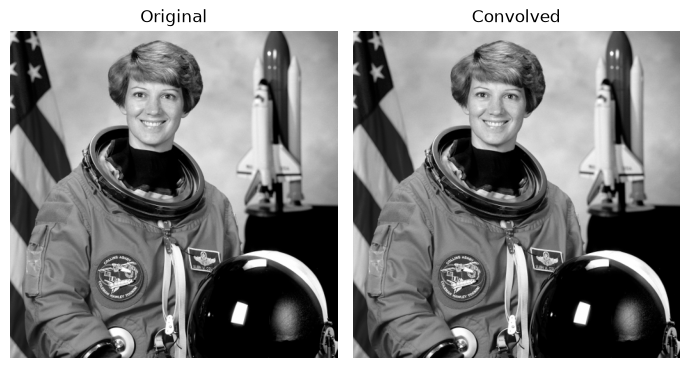

In [96]:
kernel = np.array(kernel_matrix.value)
convolved = convolve2d(gray_image, kernel, mode="same", boundary="symm")
convolved_clipped = np.clip(convolved, 0, 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7, 7))
ax1.imshow(gray_image, cmap="gray", vmin=0, vmax=1)
ax1.set_title("Original")
ax1.axis("off")
ax2.imshow(convolved_clipped, cmap="gray", vmin=0, vmax=1)
ax2.set_title("Convolved")
ax2.axis("off")
plt.tight_layout()

In [97]:
controls = [image_dropdown]
if image_dropdown.value == "Custom URL":
    controls.append(url_input)

_FlexContainerHtml()
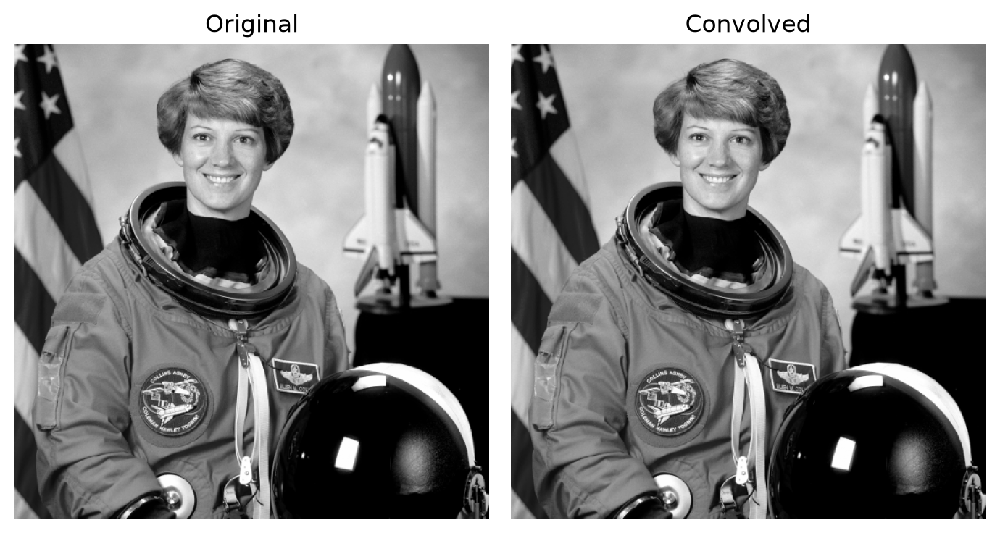

In [98]:
mo.vstack(
    [
        mo.md("## Presets"),
        mo.hstack([kernel_size_dropdown, kernel_dropdown] + controls),
        mo.md("<br>"),
        mo.md("## Effect of the Kernel"),
        mo.hstack([kernel_matrix, mo.hstack([fig])]),
    ]
)

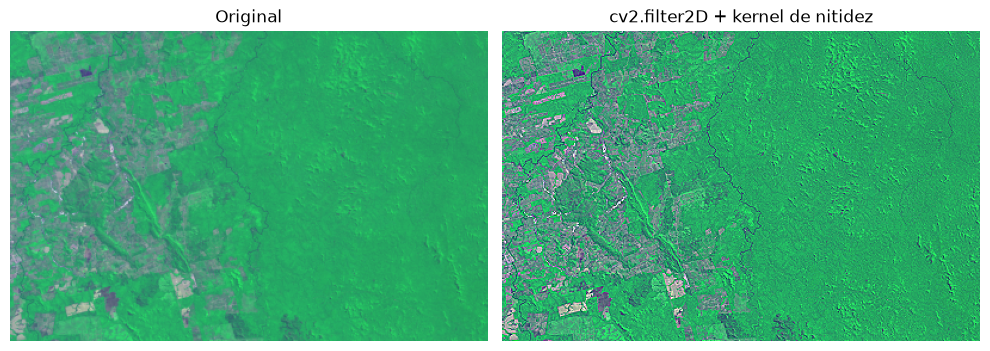

In [10]:
# um kernel de nitidez "na mão", aplicado com cv2.filter2D
kernel_sharpen = np.array([
    [ 0, -1,  0],
    [-1,  5, -1],
    [ 0, -1,  0],
])
sharpened = cv2.filter2D(img, ddepth=-1, kernel=kernel_sharpen)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img)
axes[0].set_title("Original")
axes[1].imshow(sharpened)
axes[1].set_title("cv2.filter2D + kernel de nitidez")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

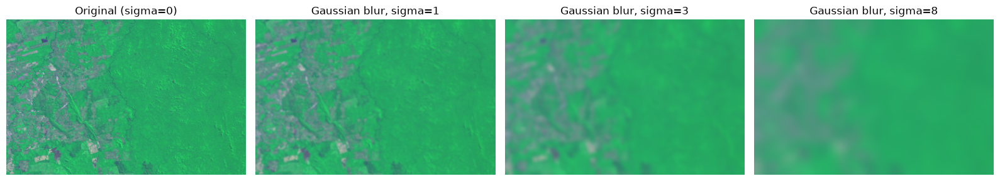

In [11]:
# comparando diferentes sigmas de Gaussian blur
sigmas = [1, 3, 8]

fig, axes = plt.subplots(1, len(sigmas) + 1, figsize=(16, 4))
axes[0].imshow(img)
axes[0].set_title("Original (sigma=0)")
for ax, sigma in zip(axes[1:], sigmas):
    borrada = cv2.GaussianBlur(img, ksize=(0, 0), sigmaX=sigma)  # ksize=(0,0) -> calculado a partir do sigma
    ax.imshow(borrada)
    ax.set_title(f"Gaussian blur, sigma={sigma}")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

## Borrando só um pedaço da imagem

Até agora borramos a imagem **inteira**. Mas um kernel não sabe nada sobre "imagem inteira" ele só enxerga o array que você entrega pra ele. Se você entregar só um pedacinho (um slice do array), ele borra só aquele pedacinho. É exatamente assim que funciona o borrão de rosto/placa de carro que você vê no Google Street View: acha a região de interesse, aplica o blur só ali, e devolve pro lugar.

Vamos fazer isso de verdade, com uma imagem aérea real, e de quebra, um motivo real pra fazer esse blur seletivo: **privacidade**. Imagens de drone/aéreas capturam gente e veículos sem querer, e blur seletivo é como se anonimiza isso antes de publicar.

### De onde vem a imagem: OpenAerialMap

O [OpenAerialMap](https://openaerialmap.org/) (OAM) é um catálogo aberto de imagens aéreas/de drone. Vamos utilizar aqui uma API REST (`api.openaerialmap.org/meta`), através de requests.

In [12]:
# bbox bem amplo cobrindo parte do Brasil (sudoeste do Pará)
bbox_brasil = [-53, -11, -43, -1]

resp = requests.get("https://api.openaerialmap.org/meta", params={"bbox": ",".join(map(str, bbox_brasil)), "limit": 5})
resultados = resp.json()["results"]

for r in resultados:
    props = r["properties"]
    print(f"{r['title']:15s} | gsd={props.get('resolution_in_meters', 0)*100:.1f} cm | "
          f"dimensões={props.get('dimensions')} | {r['uuid']}")

gb_voo13        | gsd=1.5 cm | dimensões=[15378, 13484] | https://oin-hotosm-temp.s3.us-east-1.amazonaws.com/6696e7f41684770001c339f5/2/6696e7f41684770001c339f8.tif
gb_voo24        | gsd=1.5 cm | dimensões=[15530, 13085] | https://oin-hotosm-temp.s3.us-east-1.amazonaws.com/66979b821684770001c33a21/3/66979b821684770001c33a25.tif
gb_voo28        | gsd=1.5 cm | dimensões=[13156, 15028] | https://oin-hotosm-temp.s3.us-east-1.amazonaws.com/66979b821684770001c33a21/7/66979b821684770001c33a29.tif
gb_voo01        | gsd=1.5 cm | dimensões=[15219, 13797] | https://oin-hotosm-temp.s3.us-east-1.amazonaws.com/669677151684770001c339d2/0/669677151684770001c339d3.tif
gb_voo21        | gsd=1.5 cm | dimensões=[13014, 15280] | https://oin-hotosm-temp.s3.us-east-1.amazonaws.com/66979b821684770001c33a21/0/66979b821684770001c33a22.tif


### Lendo só um pedaço, com rasterio

`gb_voo13` é uma imagem de drone gigante com mais de 15.000 x 13.000 pixels (lembra do problema de RAM que vimos na aula de STAC?). De novo, vamos só acessar um pedacinho da image através `Window`, lemos só a região de interesse, direto da URL.

Já procurei antes e sei que tem uma pessoa numa área de plantio, perto do pixel `(6320, 7020)`. Dessa forma, vamos ler uma janela de 500x500 pixels em volta desse ponto.

dimensões da imagem completa: 15378 x 13484 (207 milhões de pixels)


shape do pedaço lido: (500, 500, 3)


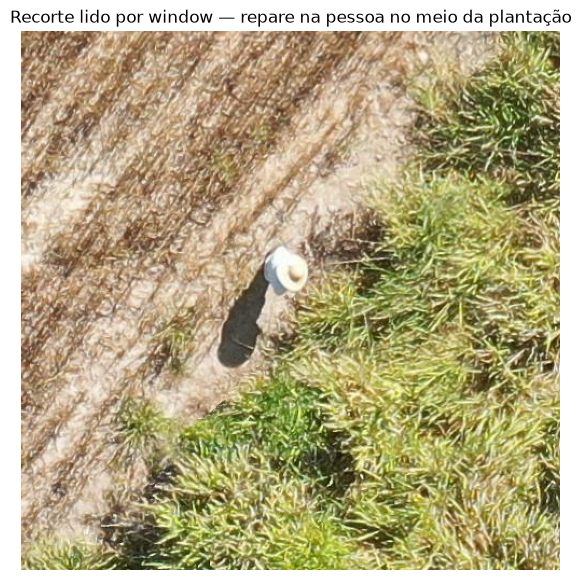

In [13]:
import rasterio
from rasterio.windows import Window

oam_url = resultados[0]["uuid"]  # href direto do GeoTIFF no S3, sem precisar de STAC

with rasterio.open(oam_url) as src:
    print("dimensões da imagem completa:", src.width, "x", src.height, f"({src.width * src.height / 1e6:.0f} milhões de pixels)")

    col_centro, row_centro = 6320, 7020
    janela = Window(col_centro - 250, row_centro - 250, 500, 500)
    aerea = src.read(window=janela)  # (bandas, linhas, colunas)
    aerea = np.transpose(aerea, (1, 2, 0))  # -> (linhas, colunas, bandas), formato que matplotlib espera

print("shape do pedaço lido:", aerea.shape)

plt.figure(figsize=(7, 7))
plt.imshow(aerea)
plt.title("Recorte lido por window — repare na pessoa no meio da plantação")
plt.axis("off")
plt.show()

### Aplicando o blur só na região da pessoa

Para isso precisamos:
1. Defina a caixa (linhas/colunas) que cobre a região sensível;
2. Recorte só esse pedaço do array (`imagem[y0:y1, x0:x1]`);
3. Aplique o Gaussian blur **só nesse recorte**;
4. Reatribua o resultado de volta na mesma posição do array original.

O resto da imagem nunca passa pelo kernel, apenas nossa região delimitada.

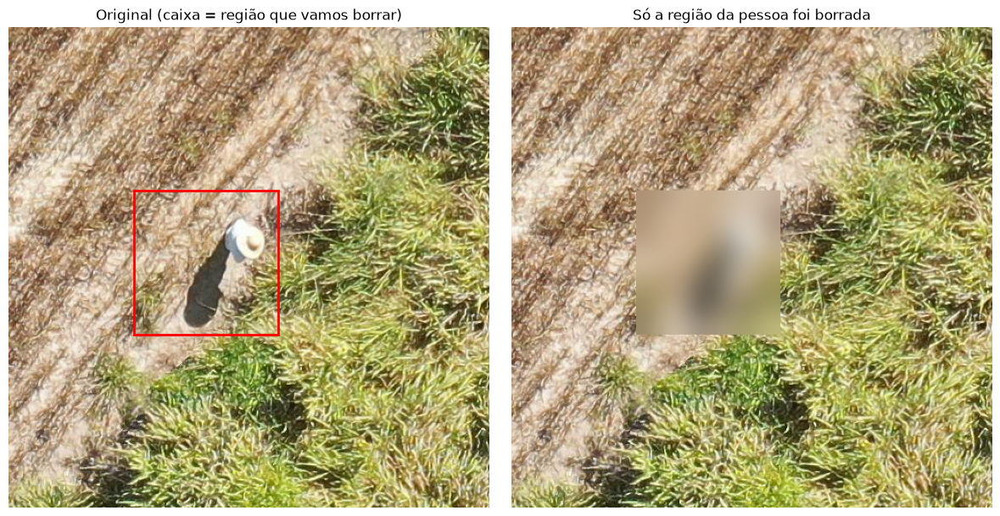

In [14]:
# caixa (y0:y1, x0:x1) em volta da pessoa, dentro do recorte de 500x500
y0, y1, x0, x1 = 170, 320, 130, 280

aerea_anonimizada = aerea.copy()
regiao = aerea_anonimizada[y0:y1, x0:x1]
regiao_borrada = cv2.GaussianBlur(regiao, ksize=(0, 0), sigmaX=15)
aerea_anonimizada[y0:y1, x0:x1] = regiao_borrada

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(aerea)
axes[0].add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor="red", linewidth=2))
axes[0].set_title("Original (caixa = região que vamos borrar)")
axes[1].imshow(aerea_anonimizada)
axes[1].set_title("Só a região da pessoa foi borrada")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

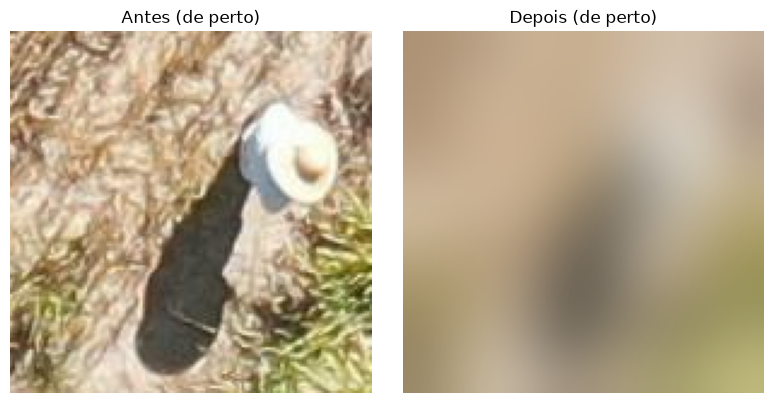

pixels borrados: 22500 de 250000 (9.0% da imagem)


In [15]:
# de perto, pra não ter dúvida de que a pessoa ficou irreconhecível
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(aerea[y0:y1, x0:x1])
axes[0].set_title("Antes (de perto)")
axes[1].imshow(aerea_anonimizada[y0:y1, x0:x1])
axes[1].set_title("Depois (de perto)")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

print(f"pixels borrados: {(y1 - y0) * (x1 - x0)} de {aerea.shape[0] * aerea.shape[1]} "
      f"({(y1 - y0) * (x1 - x0) / (aerea.shape[0] * aerea.shape[1]) * 100:.1f}% da imagem)")

# Detecção de bordas

Como vimos, o kernel nos dá a possibilidade de aplicarmos diferentes propriedades na imagem de uma forma muito simples e rápida. Com os kernel, conseguimos detectar bordas (edges). Existem dois kernels muito famosos que servem para detecção de bordas.

## Sobel

Uma borda é, matematicamente, um lugar onde a intensidade muda **bruscamente**. O filtro de **Sobel** é um kernel que aproxima a derivada (o "gradiente") da imagem um pra detectar mudanças na horizontal, outro na vertical. Onde o gradiente é grande, tem borda.

## Canny

O **Canny** é o detector de bordas mais usado na prática, ele faz Sobel só que com mais passos: (1) borra a imagem com Gaussian blur pra reduzir ruído, (2) calcula o gradiente (tipo Sobel), (3) afina as bordas pra ficarem com 1 pixel de largura, (4) usa dois limiares (um alto, um baixo) pra decidir o que é realmente borda.

Por isso ele já "embute" a lição da seção anterior: **reduzir ruído com blur antes de procurar bordas** evita detectar um monte de bordas falsas (textura/ruído confundido com borda de verdade).

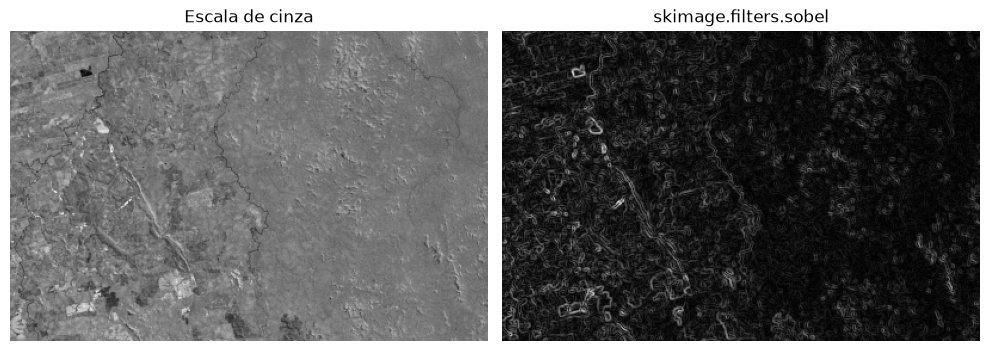

In [16]:
sobel_edges = filters.sobel(gray_sk)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(gray_sk, cmap="gray")
axes[0].set_title("Escala de cinza")
axes[1].imshow(sobel_edges, cmap="gray")
axes[1].set_title("skimage.filters.sobel")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

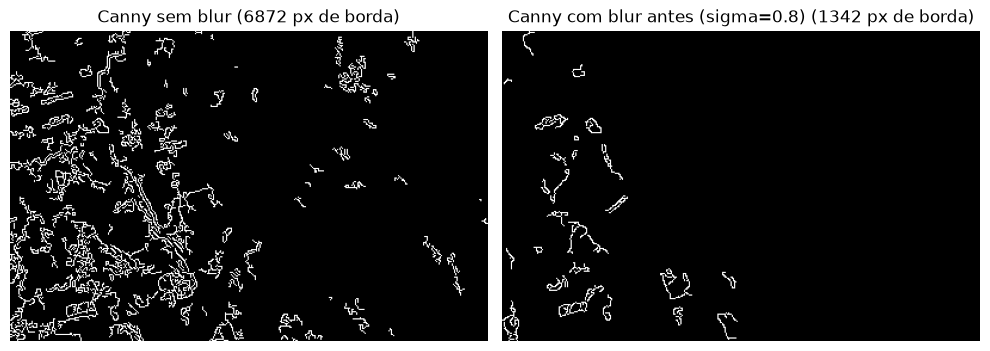

In [17]:
# Canny direto na imagem original vs. depois de um Gaussian blur
canny_sem_blur = cv2.Canny(gray_cv, threshold1=50, threshold2=150)

gray_borrado = cv2.GaussianBlur(gray_cv, ksize=(0, 0), sigmaX=0.8)
canny_com_blur = cv2.Canny(gray_borrado, threshold1=50, threshold2=150)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(canny_sem_blur, cmap="gray")
axes[0].set_title(f"Canny sem blur ({(canny_sem_blur > 0).sum()} px de borda)")
axes[1].imshow(canny_com_blur, cmap="gray")
axes[1].set_title(f"Canny com blur antes (sigma=0.8) ({(canny_com_blur > 0).sum()} px de borda)")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

# Connected Component Analysis (CCA)

Depois de transformar uma imagem em binária (preto/branco), o próximo passo natural seria compreender quantos objetos distintos existem e onde eles estão. Isso é o que a análise de componentes conectados faz, ela agrupa pixels brancos que se tocam num "blob" só, numerado.

Isso é super útil em sensoriamento remoto, serve para por exemplo contar clareiras de desmatamento, identificar talhões agrícolas, isolar nuvens, contar edificações, etc.

Vamos binarizar nossa imagem com **Otsu** (um método que escolhe o limiar de corte automaticamente, sem a gente precisar chutar um número) e rodar a CCA em cima.

componentes encontrados (sem contar o fundo): 1420


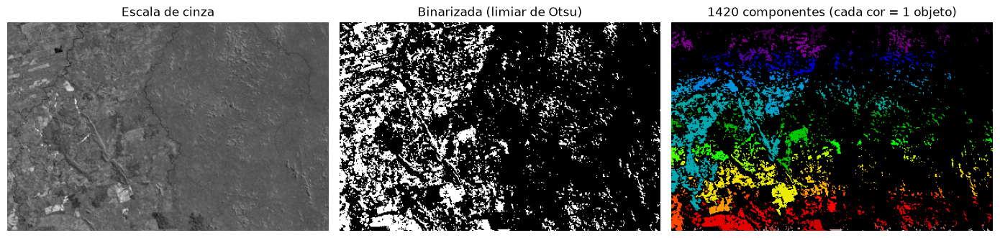

In [18]:
_, binary = cv2.threshold(gray_cv, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
num_labels, labels_im, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

print(f"componentes encontrados (sem contar o fundo): {num_labels - 1}")

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(gray_cv, cmap="gray")
axes[0].set_title("Escala de cinza")
axes[1].imshow(binary, cmap="gray")
axes[1].set_title("Binarizada (limiar de Otsu)")
axes[2].imshow(labels_im, cmap="nipy_spectral")
axes[2].set_title(f"{num_labels - 1} componentes (cada cor = 1 objeto)")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

Repare que deu um número **enorme** de componentes. Muito provavelmente isso é textura/ruído virando "objetos" de 1-2 pixels, não objetos de verdade. Na prática, quase sempre filtramos por **área mínima** pra ficar só com os componentes relevantes.

componentes antes do filtro: 1420  |  depois (área >= 50px): 50


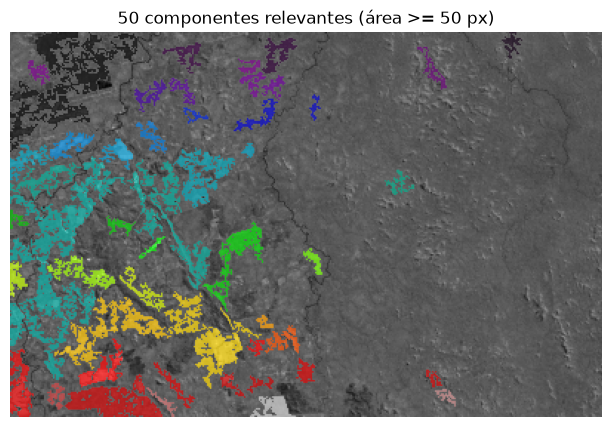

componente 490: área=2508px, centro=(31, 156)
componente 3: área=1820px, centro=(37, 31)
componente 989: área=1007px, centro=(134, 206)
componente 1254: área=902px, centro=(70, 249)
componente 1012: área=811px, centro=(67, 201)


In [19]:
area_minima = 50  # em pixels

labels_limpo = labels_im.copy()
for rotulo in range(1, num_labels):  # rotulo 0 é o fundo, pula ele
    if stats[rotulo, cv2.CC_STAT_AREA] < area_minima:
        labels_limpo[labels_limpo == rotulo] = 0

componentes_validos = [r for r in range(1, num_labels) if stats[r, cv2.CC_STAT_AREA] >= area_minima]
print(f"componentes antes do filtro: {num_labels - 1}  |  depois (área >= {area_minima}px): {len(componentes_validos)}")

fig, ax = plt.subplots(figsize=(8, 5))
ax.imshow(gray_cv, cmap="gray")
ax.imshow(np.ma.masked_where(labels_limpo == 0, labels_limpo), cmap="nipy_spectral", alpha=0.7)
ax.set_title(f"{len(componentes_validos)} componentes relevantes (área >= {area_minima} px)")
ax.axis("off")
plt.show()

# as 5 maiores manchas: centro e área
maiores = sorted(componentes_validos, key=lambda r: stats[r, cv2.CC_STAT_AREA], reverse=True)[:5]
for r in maiores:
    area = stats[r, cv2.CC_STAT_AREA]
    cx, cy = centroids[r]
    print(f"componente {r}: área={area}px, centro=({cx:.0f}, {cy:.0f})")

# Pré-processamento para redes neurais

Se você já viu (ou vai ver) uma rede neural convolucional (CNN) sendo treinada, a etapa de "preparar os dados" **é literalmente** um monte das operações que acabamos de fazer:

| O que fizemos hoje | Por que aparece antes de treinar uma rede |
|---|---|
| Resize | Toda CNN espera uma entrada de tamanho **fixo** (ex: 224x224) |
| Normalização de brilho/contraste | Pixels em `float32` entre `0` e `1` (ou padronizados) treinam muito melhor do que `uint8` cru |
| Crop | "Random crop" é uma técnica de *data augmentation* — recorta pedaços aleatórios pra rede não decorar a posição exata dos objetos |
| Blur / brilho / contraste | Também viram *augmentation*: aplicar blur, mudar brilho aleatoriamente, etc. durante o treino ensina a rede a ser robusta a essas variações |
| Grayscale/canais | Algumas arquiteturas trabalham com 1 canal só, outras esperam sempre 3 — sempre confira o que seu modelo espera |

Na prática, isso tudo já vem empacotado em bibliotecas como `torchvision.transforms`, `albumentations.

In [20]:
def preprocess_para_cnn(imagem_rgb, tamanho=224):
    """Resize + normalização, do jeito que uma CNN pré-treinada (ex: ResNet) costuma esperar."""
    redimensionada = cv2.resize(imagem_rgb, (tamanho, tamanho), interpolation=cv2.INTER_AREA)
    tensor = redimensionada.astype("float32") / 255.0  # 0-255 -> 0.0-1.0

    # médias/desvios do ImageNet — bem comuns quando se usa um modelo pré-treinado nele
    media = np.array([0.485, 0.456, 0.406], dtype="float32")
    desvio = np.array([0.229, 0.224, 0.225], dtype="float32")
    tensor = (tensor - media) / desvio
    return tensor


tensor_final = preprocess_para_cnn(img)
print("shape final:", tensor_final.shape, "| dtype:", tensor_final.dtype)
print("média por canal:", tensor_final.mean(axis=(0, 1)).round(3))
print("min/max:", round(float(tensor_final.min()), 2), round(float(tensor_final.max()), 2))
print()
print("faltaria só: adicionar a dimensão de 'batch' (virar (1, 224, 224, 3) ou, no PyTorch, (1, 3, 224, 224))")
print("...e isso já poderia entrar direto num model.predict(...) / model(tensor)")

shape final: (224, 224, 3) | dtype: float32
média por canal: [-1.238  0.818  0.092]
min/max: -1.55 1.94

faltaria só: adicionar a dimensão de 'batch' (virar (1, 224, 224, 3) ou, no PyTorch, (1, 3, 224, 224))
...e isso já poderia entrar direto num model.predict(...) / model(tensor)


# Referências

- [scikit-image — Images are numpy arrays](https://scikit-image.org/docs/stable/user_guide/numpy_images.html)
- [Data Carpentry — Blurring Images](https://datacarpentry.github.io/image-processing/06-blurring.html)
- [Data Carpentry — Image processing with Python](https://datacarpentry.org/image-processing/)
- [OpenCV — Image Filtering docs](https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html)
- [OpenCV — Canny Edge Detection](https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html)
- [scikit-image — Connected component labeling](https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_label.html)